In [1]:
import pyvista as pv
pv.start_xvfb()  

w_size = (1000, 1000)
zoom = 1.4

import numpy as np
from data.dataset import SUMDataset

sum_set = SUMDataset(root='data/SUM', split='test', load_feature='all')

idx = 11

raw_mesh = pv.read(sum_set.raw_mesh_list[idx])
mesh = pv.read(sum_set.processed_mesh_list[idx])

face_v = sum_set[idx].pos.cpu().numpy()
face_adj = sum_set[idx].edge_index.cpu().t().numpy()
face_adj = np.hstack((np.full((face_adj.shape[0], 1), 2), face_adj), dtype=face_adj.dtype)

f_rgba = sum_set[idx].rgba.cpu().numpy() 
f_normal = sum_set[idx].normals[:, 0:3].cpu().numpy()

mask = sum_set[idx].y.cpu().numpy()
mask_rgba = np.array([sum_set.rgba_dict[int(label)] for label in mask.tolist()], dtype=np.uint8)

## Mesh

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


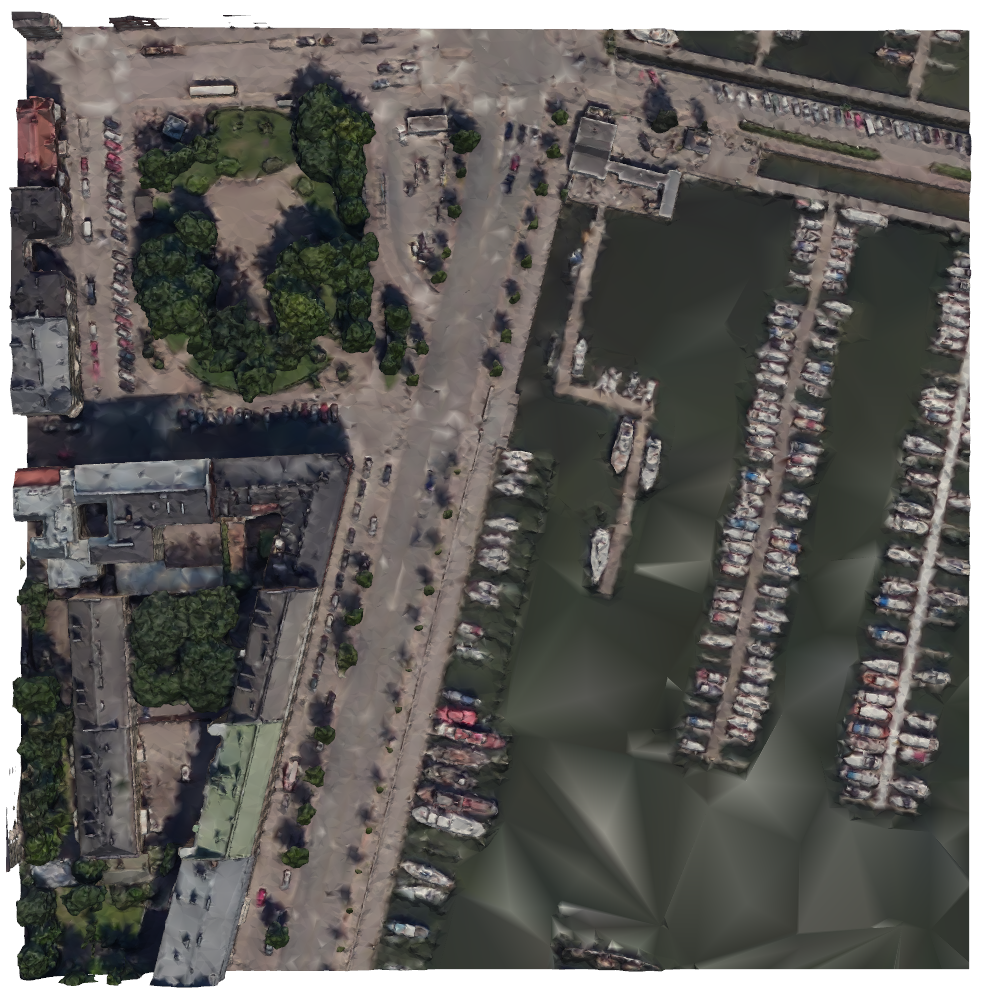

In [2]:
mesh.cell_data['RGBA'] = f_rgba
mesh.cell_data.active_scalars_name = 'RGBA'
mesh.plot(scalars='RGBA', 
          rgb=True, 
          cpos='xy', 
          window_size=w_size, 
          zoom=zoom,
          show_axes=False)

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


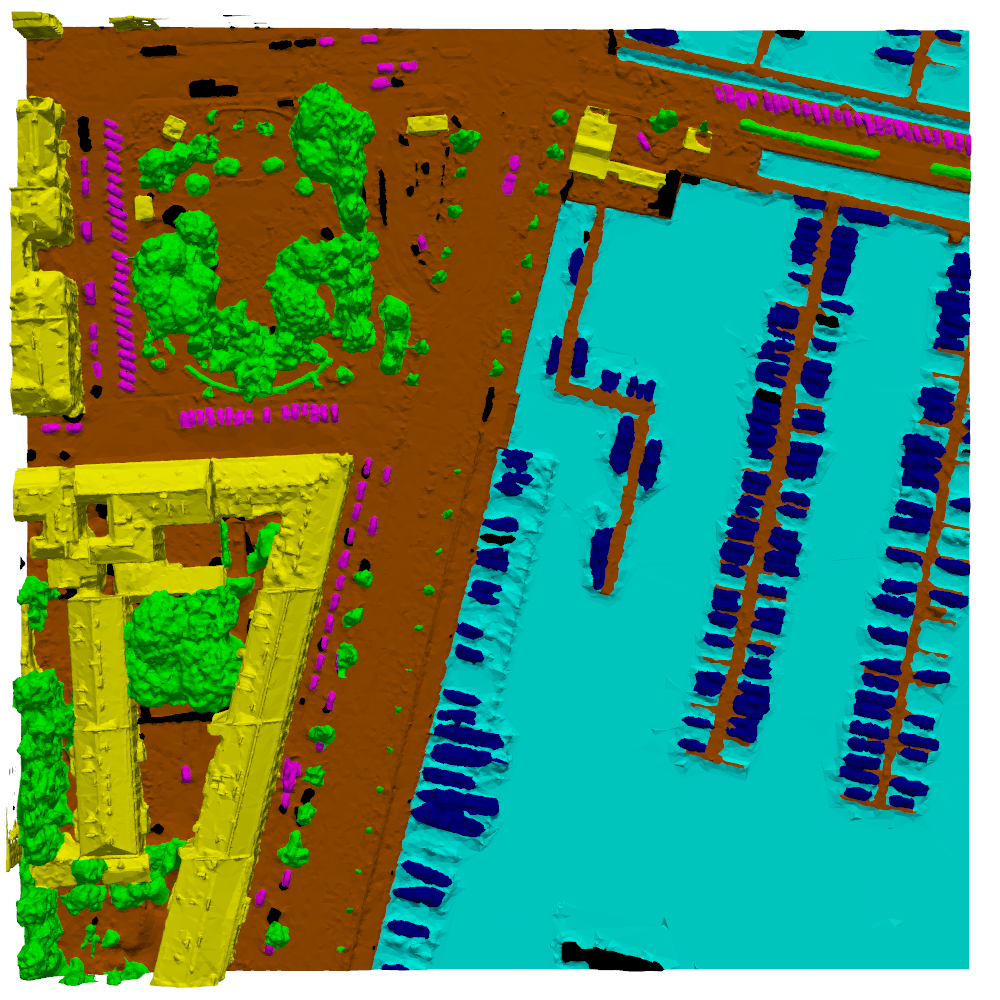

In [3]:
mesh.cell_data['Mask'] = mask_rgba
mesh.cell_data.active_scalars_name = 'Mask'
mesh.plot(scalars='Mask', 
          rgb=True,
          cpos='xy', 
          window_size=w_size,
          zoom=zoom,
          show_edges=False,
          show_axes=False,
          show_scalar_bar=False)

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


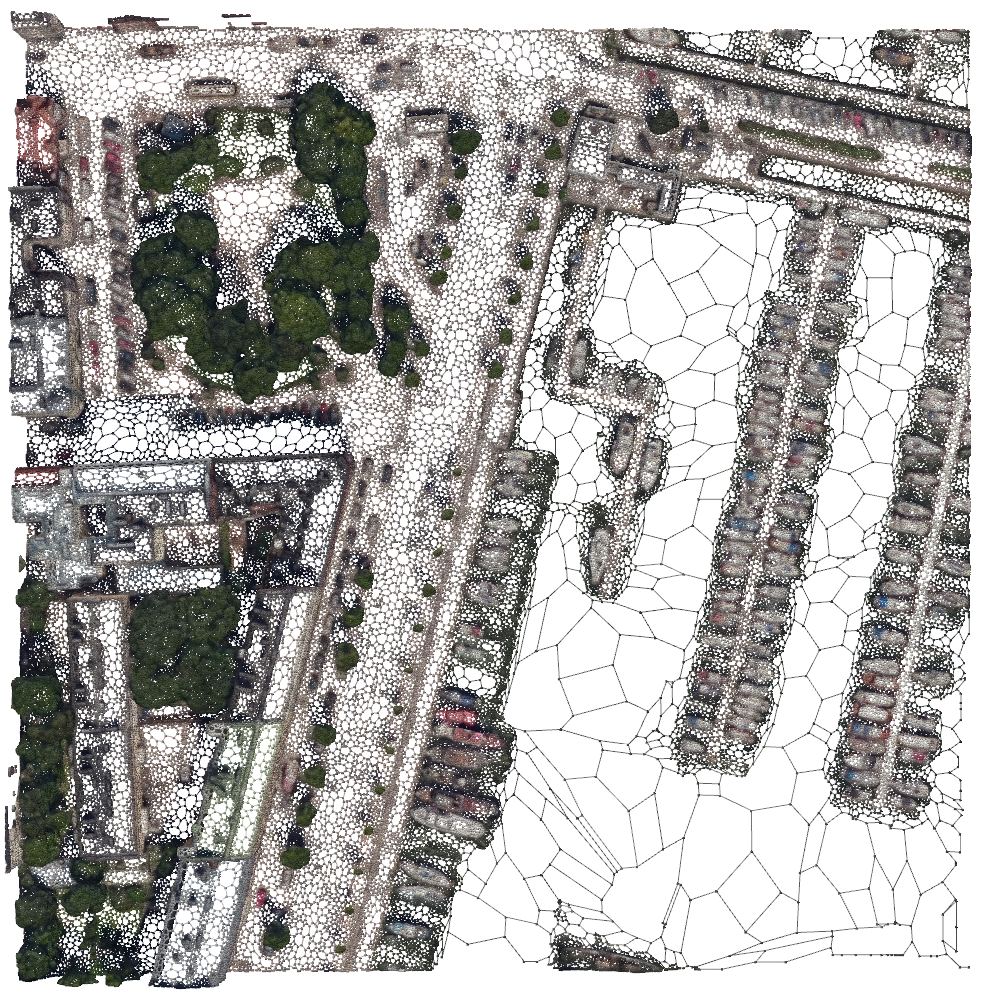

In [4]:
face_pcd = pv.PolyData(face_v)
face_pcd.lines = face_adj

face_pcd.point_data['RGBA'] = f_rgba
face_pcd.point_data.active_scalars_name = 'RGBA'
face_pcd.plot(scalars='RGBA', 
              rgb=True, 
              cpos='xy', 
              window_size=w_size, 
              zoom=zoom,
              render_points_as_spheres=True, 
              point_size=3, 
              line_width=1,
              show_axes=False)

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


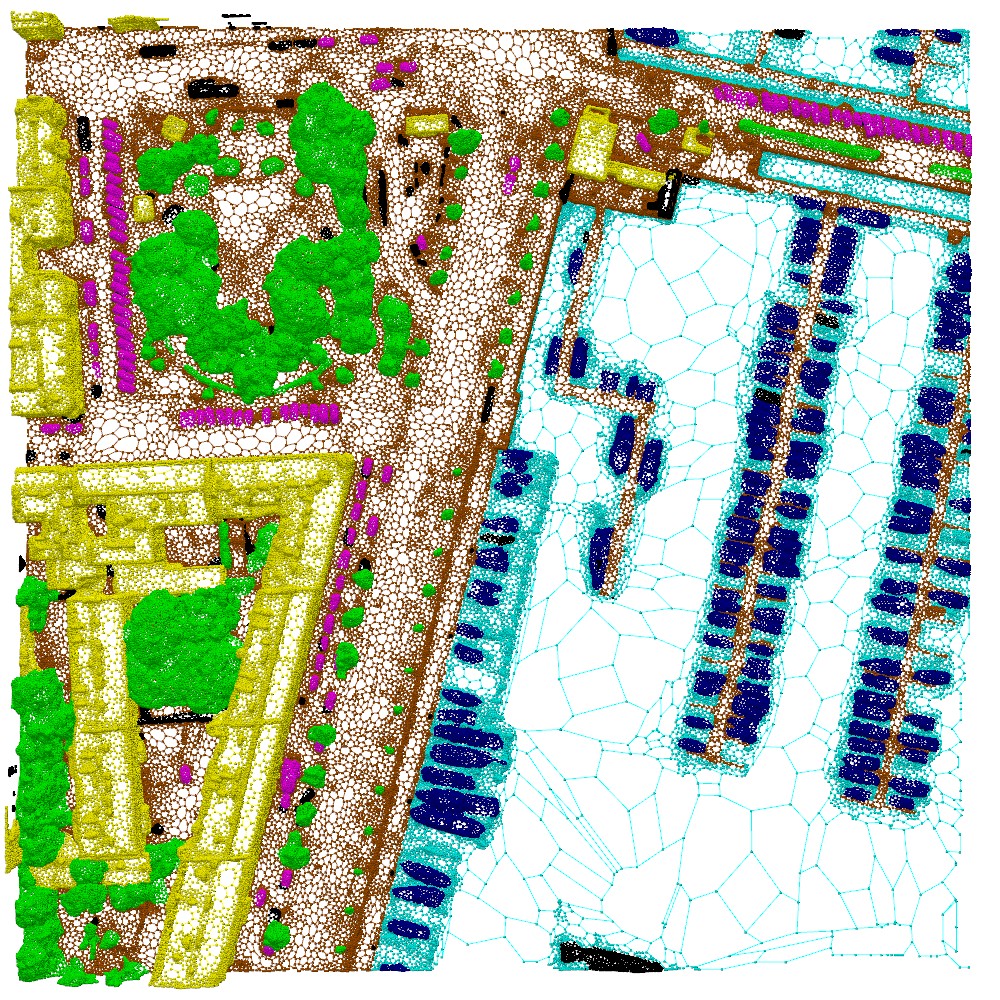

In [5]:
face_pcd.point_data['Mask'] = mask_rgba
face_pcd.point_data.active_scalars_name = 'Mask'
face_pcd.plot(scalars='Mask', 
              rgb=True,
              cpos='xy', 
              window_size=w_size, 
              zoom=zoom,
              render_points_as_spheres=True, 
              point_size=3, 
              line_width=1,
              show_axes=False,
              show_scalar_bar=False)

## Surface Normal

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


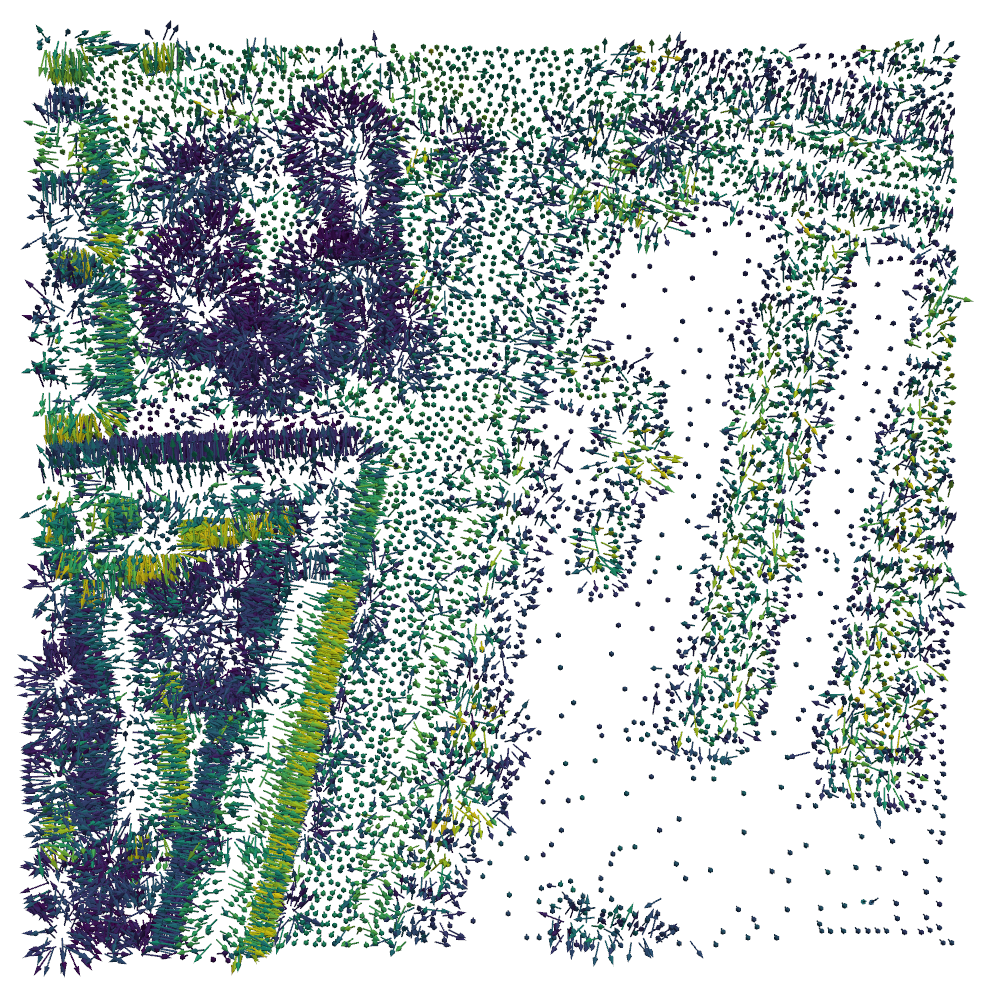

In [6]:
face_pcd.point_data['Normal'] = f_normal
arrows = face_pcd.glyph(orient='Normal', scale=False, factor=0.05, tolerance=0.005)
arrows.plot(cpos='xy', 
            window_size=w_size,
            zoom=zoom,
            show_axes=False,
            show_scalar_bar=False)

## Prediction

In [7]:
import yaml

from torch_geometric.loader import DataLoader
from torch_geometric.data import Batch
from torchmetrics.classification import Accuracy, JaccardIndex

from train.trainer import Trainer
from model.net import LMSegNet, HGAPNet, LGAPNet, GANet
    
    
# with open('cfg/sum/sum_lmseg_feature_nbrs_8.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = LMSegNet(cfg['in_channels'], 
#                      cfg['out_channels'],
#                      cfg['hid_channels'], 
#                      cfg['num_convs'], 
#                      cfg['pool_factors'], 
#                      cfg['num_nbrs'],
#                      cfg['num_block'],
#                      cfg['alpha'], 
#                      cfg['beta'])


# with open('cfg/sum/sum_lmseg_feature_nbrs_12.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = LMSegNet(cfg['in_channels'], 
#                      cfg['out_channels'],
#                      cfg['hid_channels'], 
#                      cfg['num_convs'], 
#                      cfg['pool_factors'], 
#                      cfg['num_nbrs'],
#                      cfg['num_block'],
#                      cfg['alpha'], 
#                      cfg['beta'])


# with open('cfg/sum/sum_lmseg_hsv.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = LMSegNet(cfg['in_channels'], 
#                      cfg['out_channels'],
#                      cfg['hid_channels'], 
#                      cfg['num_convs'], 
#                      cfg['pool_factors'], 
#                      cfg['num_nbrs'],
#                      cfg['num_block'],
#                      cfg['alpha'], 
#                      cfg['beta'])
    
    
# with open('cfg/sum/sum_lmseg_normals.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = LMSegNet(cfg['in_channels'], 
#                      cfg['out_channels'],
#                      cfg['hid_channels'], 
#                      cfg['num_convs'], 
#                      cfg['pool_factors'], 
#                      cfg['num_nbrs'],
#                      cfg['num_block'],
#                      cfg['alpha'], 
#                      cfg['beta'])
    

# with open('cfg/sum/sum_hgap_feature.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = HGAPNet(cfg['in_channels'], 
#                     cfg['out_channels'],
#                     cfg['hid_channels'], 
#                     cfg['num_convs'], 
#                     cfg['pool_factors'], 
#                     cfg['num_nbrs'],
#                     cfg['num_block'],
#                     cfg['alpha'], 
#                     cfg['beta'])
    
    
# with open('cfg/sum/sum_lgap_feature.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = LGAPNet(cfg['in_channels'], 
#                     cfg['out_channels'],
#                     cfg['hid_channels'], 
#                     cfg['num_convs'], 
#                     cfg['pool_factors'], 
#                     cfg['num_block'],
#                     cfg['alpha'], 
#                     cfg['beta'])


# with open('cfg/sum/sum_ga_feature.yaml', 'r') as f:
#     cfg = yaml.safe_load(f)
#     cfg['device'] = 'cpu'
#     model = GANet(cfg['in_channels'], 
#                   cfg['out_channels'],
#                   cfg['hid_channels'], 
#                   cfg['num_convs'], 
#                   cfg['pool_factors'], 
#                   cfg['num_nbrs'],
#                   cfg['num_block'])


with open('cfg/sum/sum_lmseg_feature.yaml', 'r') as f:
    cfg = yaml.safe_load(f)
    cfg['device'] = 'cpu'
    cfg['path'] = 'save/sum/sum_lmseg_feature_4'
    model = LMSegNet(cfg['in_channels'], 
                     cfg['out_channels'],
                     cfg['hid_channels'], 
                     cfg['num_convs'], 
                     cfg['pool_factors'], 
                     cfg['num_nbrs'],
                     cfg['num_block'],
                     cfg['alpha'], 
                     cfg['beta'])

trainer = Trainer(cfg=cfg) 
model = trainer.load_weights(model, f"epoch{cfg['epoch']}")

## Evaluation

In [8]:
test_loader = DataLoader(sum_set, 
                         batch_size=cfg['batch'], 
                         shuffle=False, 
                         num_workers=cfg['workers'])

metric_dict = {
            'OA': Accuracy(task="multiclass", 
                            num_classes=cfg['out_channels'], 
                            ignore_index=0,
                            average='micro'),
            'mAcc': Accuracy(task="multiclass", 
                             num_classes=cfg['out_channels'], 
                             ignore_index=0,
                             average='macro'),
            'mIoU': JaccardIndex(task="multiclass", 
                                 num_classes=cfg['out_channels'], 
                                 ignore_index=0,
                                 average='macro'),
            'IoU': JaccardIndex(task="multiclass", 
                                num_classes=cfg['out_channels'], 
                                ignore_index=0,
                                average=None)
            }

cm = trainer.eval(model, 
                  test_loader, 
                  metric=metric_dict, 
                  ckpt=f"epoch{cfg['epoch']}",
                  verbose=True)

OA: 0.9413355588912964
mAcc: 0.8104409575462341
mIoU: 0.7367621064186096
IoU: [0.0, 0.8201619386672974, 0.9358769655227661, 0.9345773458480835, 0.7083179950714111, 0.7283582091331482, 0.29328012466430664]


In [9]:
test_loader = DataLoader(sum_set, 
                         batch_size=cfg['batch'], 
                         shuffle=False, 
                         num_workers=cfg['workers'])

metric_dict = {
            'OA': Accuracy(task="multiclass", 
                            num_classes=cfg['out_channels'], 
                            ignore_index=0,
                            average='micro'),
            'mAcc': Accuracy(task="multiclass", 
                             num_classes=cfg['out_channels'], 
                             ignore_index=0,
                             average='macro'),
            'mIoU': JaccardIndex(task="multiclass", 
                                 num_classes=cfg['out_channels'], 
                                 ignore_index=0,
                                 average='macro'),
            'IoU': JaccardIndex(task="multiclass", 
                                num_classes=cfg['out_channels'], 
                                ignore_index=0,
                                average=None)
            }

cm = trainer.eval(model, 
                  test_loader, 
                  metric=metric_dict, 
                  ckpt=f"epoch{cfg['epoch']}",
                  verbose=True)

OA: 0.9403103590011597
mAcc: 0.810034990310669
mIoU: 0.7350561022758484
IoU: [0.0, 0.8160917162895203, 0.9357841610908508, 0.933207631111145, 0.7058584690093994, 0.7333680987358093, 0.28602638840675354]


/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


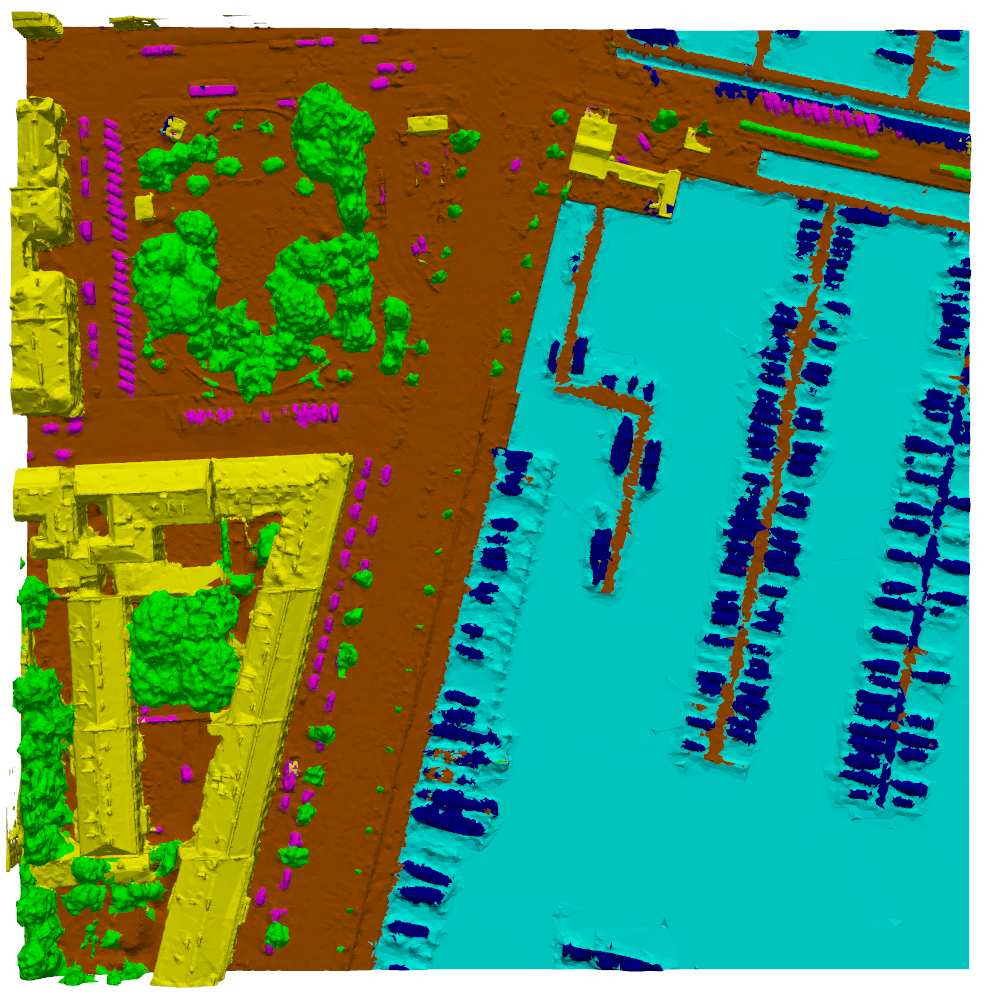

In [10]:
y = model(Batch.from_data_list([sum_set[idx]]).to(cfg['device']))['y'].detach().cpu().numpy()
y = np.argmax(y, axis=-1, keepdims=False)

pred = np.array([sum_set.rgba_dict[int(pred)] for pred in y.tolist()], dtype=np.uint8) 

mesh.cell_data['Pred'] = pred
mesh.cell_data.active_scalars_name = 'Pred'
mesh.plot(scalars='Pred', 
          rgb=True, 
          cpos='xy', 
          window_size=w_size,           
          zoom=zoom,
          show_axes=False,
          show_scalar_bar=False)

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


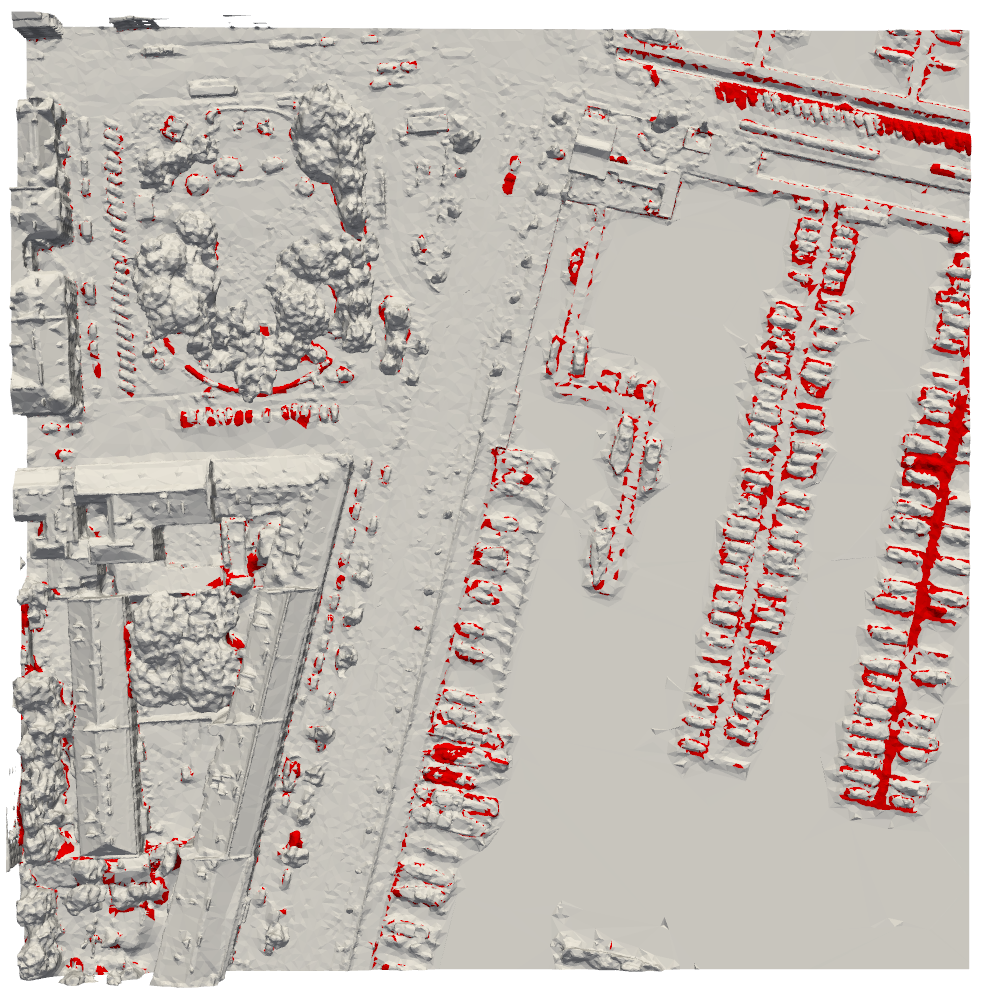

In [11]:
error = (y != mask)
error[mask == 0] = 0

mesh.cell_data['Error'] = error
mesh.cell_data.active_scalars_name = 'Error'
mesh.plot(scalars='Error', 
          cpos='xy', 
          cmap=['white', 'red'],
          window_size=w_size,           
          zoom=zoom,
          show_axes=False,
          show_scalar_bar=False)

In [12]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output
    return hook

/data/anaconda3/envs/gdl/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:33: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/data/anaconda3/envs/gdl/lib/python3.9/site-packages/trame/widgets/__init__.py)

Falling back to a static output.
  warnings.warn(


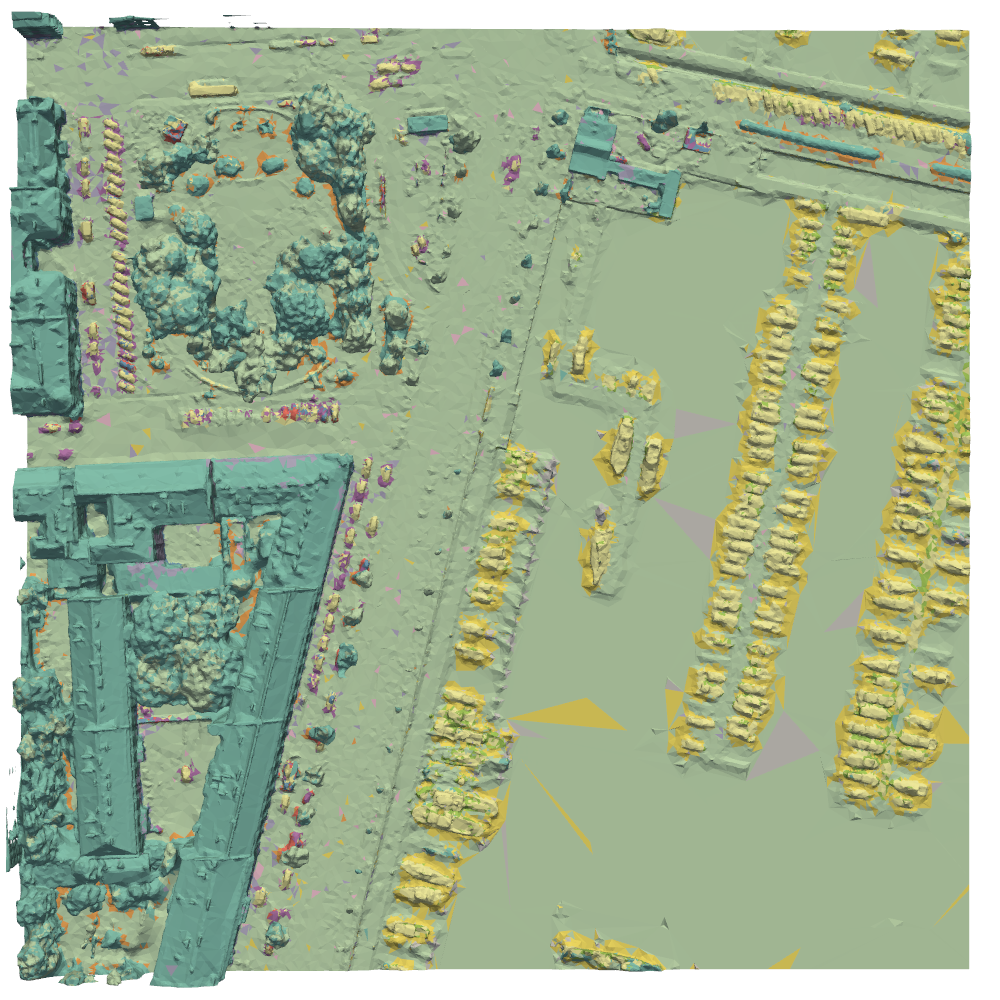

In [13]:
model.Dec.up_convs[3].register_forward_hook(get_activation('out'))
model(Batch.from_data_list([sum_set[idx]]).to(cfg['device']))['y']
out = activation['out'].argmax(keepdim=True, dim=-1).detach().cpu().numpy()

mesh.cell_data['Out'] = out
mesh.cell_data.active_scalars_name = 'Out'
mesh.plot(scalars='Out', 
          cpos='xy', 
          window_size=w_size,           
          zoom=zoom,
          cmap='Set3',
          show_axes=False,
          show_scalar_bar=False)

## Gen Aggr

In [14]:
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_theme(style="darkgrid", 
              palette="pastel")
sns.set_theme(rc={"figure.dpi": 250, 
                  'savefig.dpi': 250,
                  "axes.spines.right": False, 
                  "axes.spines.top": False})

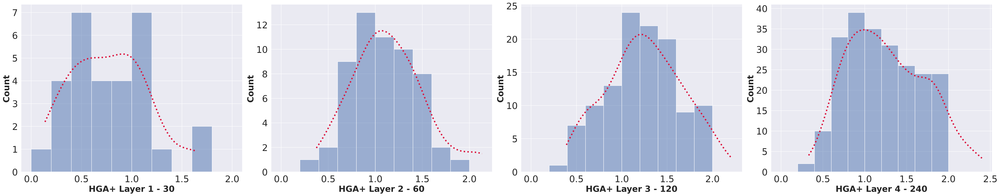

In [15]:
HGA_t = []

for name, param in model.named_parameters():
  if name in ['Enc.down_convs_hier.0.gen_aggr.t',
              'Enc.down_convs_hier.1.gen_aggr.t',
              'Enc.down_convs_hier.2.gen_aggr.t',
              'Enc.down_convs_hier.3.gen_aggr.t']:
    HGA_t.append(param.detach().cpu().numpy())
    

f, axes = plt.subplots(1, len(HGA_t), figsize=(40, 8))
layer = 1
    
for t, ax in zip(HGA_t, axes.flatten()):    
    hist = sns.histplot(t.reshape(-1, 1), legend=False, ax=ax, kde=True, 
                        bins=[0.0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2.0],
                        line_kws={'lw': 4, 'ls': ':'})
    hist.lines[0].set_color('crimson')
    hist.tick_params(labelsize=26)
    
    hist.set_xlabel(f'HGA+ Layer {layer} - {t.shape[0]}', weight='bold', fontsize=24)
    hist.set_ylabel('Count', weight='bold', fontsize=24)
    
    layer += 1
    
plt.tight_layout()

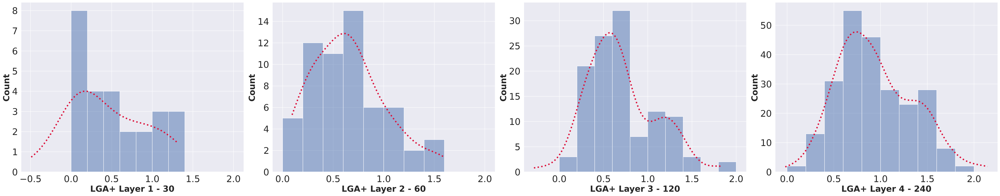

In [16]:

LGA_t = []

for name, param in model.named_parameters():
  if name in ['Enc.down_convs_local.0.gen_aggr.t',
              'Enc.down_convs_local.1.gen_aggr.t',
              'Enc.down_convs_local.2.gen_aggr.t',
              'Enc.down_convs_local.3.gen_aggr.t']:
    LGA_t.append(param.detach().cpu().numpy())
    

f, axes = plt.subplots(1, len(HGA_t), figsize=(40, 8))
layer = 1

for t, ax in zip(LGA_t, axes.flatten()):
    hist = sns.histplot(t.reshape(-1, 1), legend=False, ax=ax, kde=True, 
                        bins=[0.0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2.0],
                        line_kws={'lw': 4, 'ls': ':'})
    hist.lines[0].set_color('crimson')
    hist.tick_params(labelsize=26)
    
    hist.set_xlabel(f'LGA+ Layer {layer} - {t.shape[0]}', weight='bold', fontsize=24)
    hist.set_ylabel('Count', weight='bold', fontsize=24)
    
    layer += 1
    
plt.tight_layout()

## Surface Area

In [17]:
import trimesh 
import torch

test_mask = [] 
face_areas = []

for idx, f in enumerate(sum_set.processed_mesh_list):
    plydata = trimesh.load(f, force="mesh")
    
    face_areas.append(torch.from_numpy(np.asarray(plydata.area_faces)))
    test_mask.append(sum_set[idx].y.cpu())
    
test_mask = torch.hstack(test_mask)
face_areas = torch.hstack(face_areas)

/tmp/ipykernel_2825252/3057688980.py:10: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1659484806139/work/torch/csrc/utils/tensor_numpy.cpp:172.)
  face_areas.append(torch.from_numpy(np.asarray(plydata.area_faces)))


In [18]:
from torch_geometric.nn import aggr 

sum_aggr = aggr.SumAggregation()
area_per_mask = sum_aggr(face_areas.view(-1, 1), test_mask)

area_per_mask / area_per_mask.sum()

tensor([[0.0281],
        [0.2360],
        [0.1435],
        [0.5072],
        [0.0480],
        [0.0156],
        [0.0216]], dtype=torch.float64)